In [1]:
import sys
!{sys.executable} -m pip install openpyxl

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from half_normal_plotting import HalfNormPlot
import math
from statsmodels.formula.api import ols
import statsmodels.api as sm

## 1.
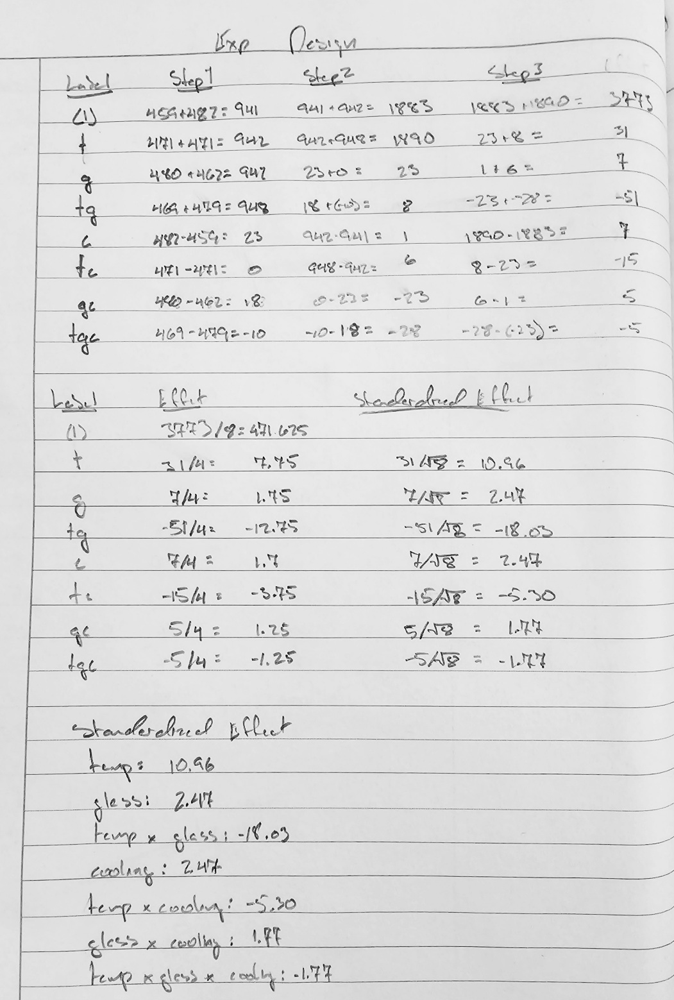

#### c.
Create Half Normal Plot

In [3]:
#read in data
data = pd.read_excel("Assignment 2 Question 1 Data.xlsx", sheet_name="effects_values")
data

,effect,value
0,temp,10.96
1,glass,2.47
2,temp x glass,-18.03
3,cooling,2.47
4,temp x cooling,-5.30
5,glass x cooling,1.77
6,temp x glass x cooling,-1.77


In [4]:
half_norm = HalfNormPlot(data=data, data_col="value", label_col="effect")
half_norm.half_norm_data

,effect,value,abs_value,r_i,r_i*,p_i,v_i
0,glass x cooling,1.77,1.77,1.0,0.071429,0.535714,0.089642
1,temp x glass x cooling,-1.77,1.77,2.0,0.214286,0.607143,0.271880
2,glass,2.47,2.47,3.0,0.357143,0.678571,0.463708
3,cooling,2.47,2.47,4.0,0.500000,0.750000,0.674490
4,temp x cooling,-5.30,5.30,5.0,0.642857,0.821429,0.920823
5,temp,10.96,10.96,6.0,0.785714,0.892857,1.241867
6,temp x glass,-18.03,18.03,7.0,0.928571,0.964286,1.802743


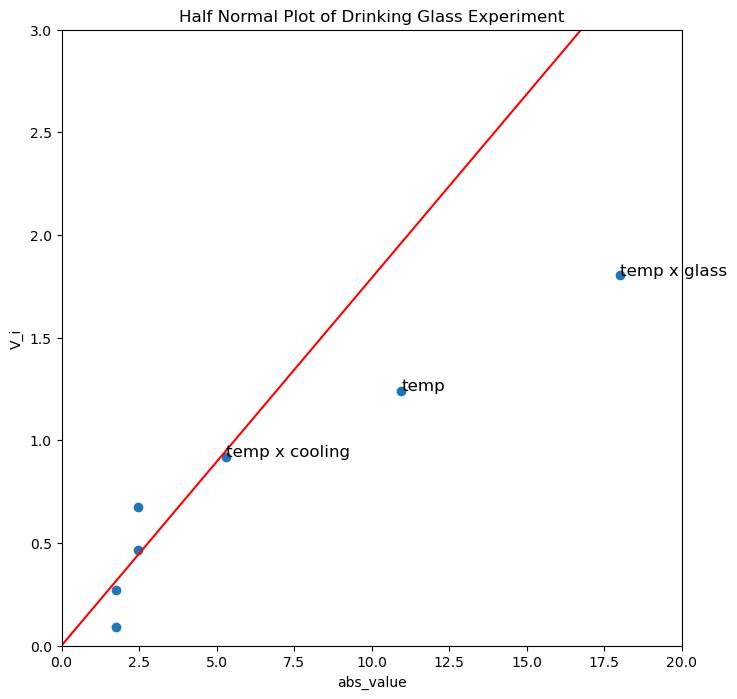

In [5]:
plot = half_norm.plot_half_norm(title="Half Normal Plot of Drinking Glass Experiment", data_percent=.7, label_num=3)
plot.set_xlim(0,20)
plot.set_ylim(0,3);

In [6]:
half_norm.half_norm_data

,effect,value,abs_value,r_i,r_i*,p_i,v_i
0,glass x cooling,1.77,1.77,1.0,0.071429,0.535714,0.089642
1,temp x glass x cooling,-1.77,1.77,2.0,0.214286,0.607143,0.271880
2,glass,2.47,2.47,3.0,0.357143,0.678571,0.463708
3,cooling,2.47,2.47,4.0,0.500000,0.750000,0.674490
4,temp x cooling,-5.30,5.30,5.0,0.642857,0.821429,0.920823
5,temp,10.96,10.96,6.0,0.785714,0.892857,1.241867
6,temp x glass,-18.03,18.03,7.0,0.928571,0.964286,1.802743


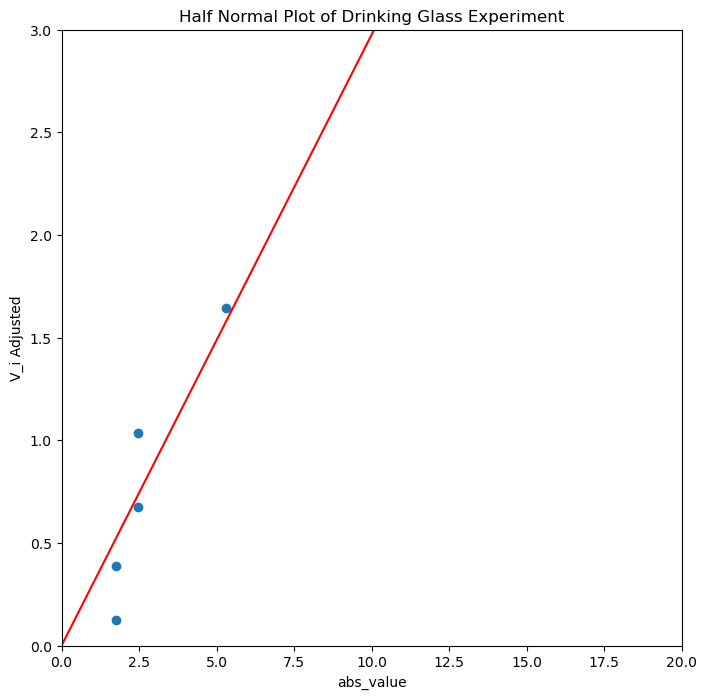

In [7]:
plot = half_norm.plot_half_norm(title="Half Normal Plot of Drinking Glass Experiment", num_adjust=2)
plot.set_xlim(0,20)
plot.set_ylim(0,3);

In [8]:
half_norm.half_norm_data_adj

,effect,value,abs_value,r_i,r_i*,p_i,v_i
0,glass x cooling,1.77,1.77,1.0,0.1,0.55,0.125661
1,temp x glass x cooling,-1.77,1.77,2.0,0.3,0.65,0.385320
2,glass,2.47,2.47,3.0,0.5,0.75,0.674490
3,cooling,2.47,2.47,4.0,0.7,0.85,1.036433
4,temp x cooling,-5.30,5.30,5.0,0.9,0.95,1.644854


It appears temp and temp x glass are significant.

#### d. 

In [10]:
#get sigma from slope of regression line through non-significant effects
half_norm.sigma_from_adjusted_regression()

3.3620105404841856

An estimate of the experimental variance is 3.362 which is the slope of a regression line through all the non-significant points.

### 2)


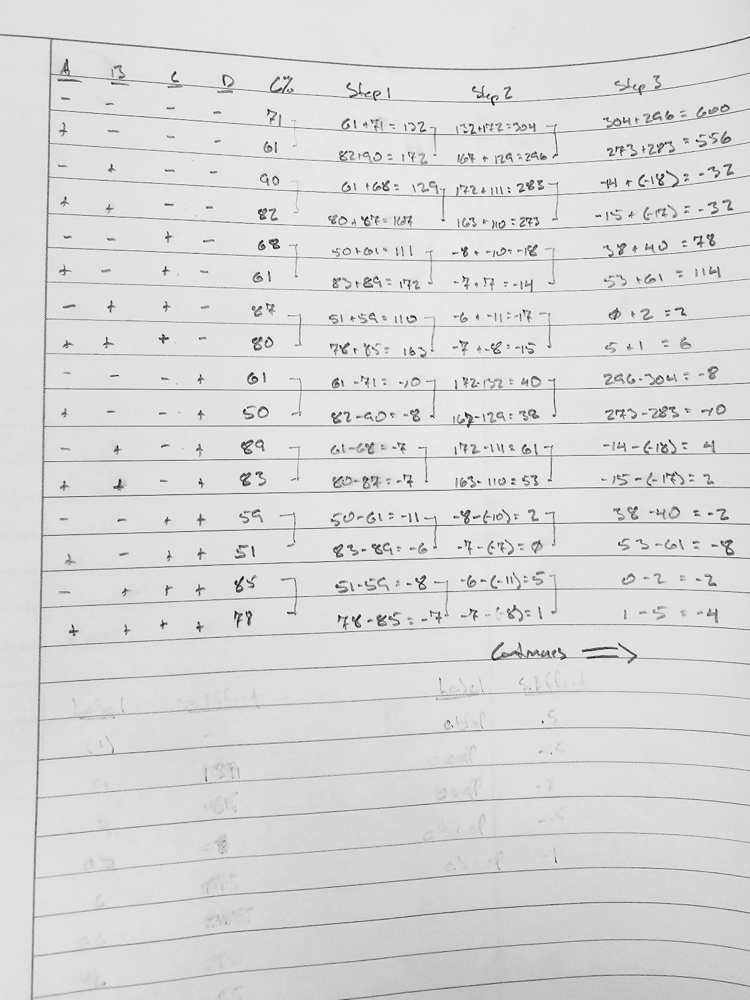

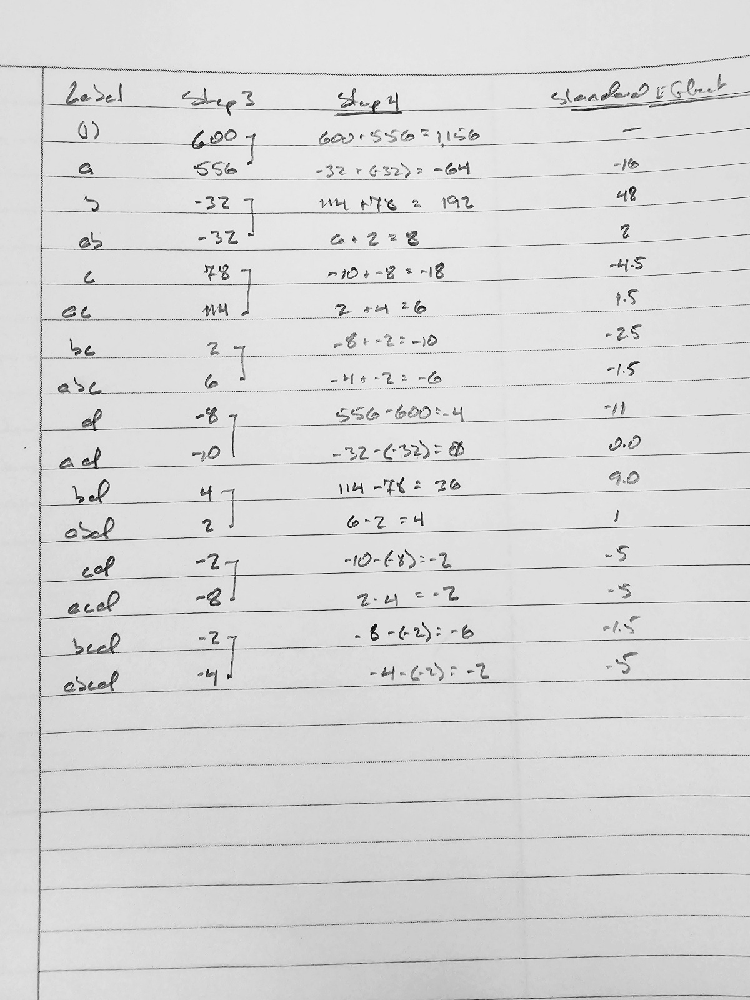

In [11]:
effects = [-16, 48, 2, -4.5, 1.5, -2.5, -1.5, -11, 0, 9, 1, -5, -5, -1.5, -5]
labels = ['a','b','ab','c','ac','bc','abc','d','ad','bd','abd','cd','acd','bcd','abcd']
df = pd.DataFrame(data={'label':labels,'standardized effects':effects})
df.sort_values(by='standardized effects')

,label,standardized effects
0,a,-16.0
7,d,-11.0
11,cd,-5.0
12,acd,-5.0
14,abcd,-5.0
3,c,-4.5
5,bc,-2.5
6,abc,-1.5
13,bcd,-1.5
8,ad,0.0


### 3)

In [12]:
#make half normal plot
half_norm2 = HalfNormPlot(data=df, data_col="standardized effects", label_col="label")
half_norm2.half_norm_data

,label,standardized effects,abs_standardized effects,r_i,r_i*,p_i,v_i
0,ad,0.0,0.0,1.0,0.033333,0.516667,0.041789
1,abd,1.0,1.0,2.0,0.100000,0.550000,0.125661
2,ac,1.5,1.5,3.0,0.166667,0.583333,0.210428
3,abc,-1.5,1.5,4.0,0.233333,0.616667,0.296738
4,bcd,-1.5,1.5,5.0,0.300000,0.650000,0.385320
5,ab,2.0,2.0,6.0,0.366667,0.683333,0.477040
6,bc,-2.5,2.5,7.0,0.433333,0.716667,0.572968
7,c,-4.5,4.5,8.0,0.500000,0.750000,0.674490
8,cd,-5.0,5.0,9.0,0.566667,0.783333,0.783500
9,acd,-5.0,5.0,10.0,0.633333,0.816667,0.902735


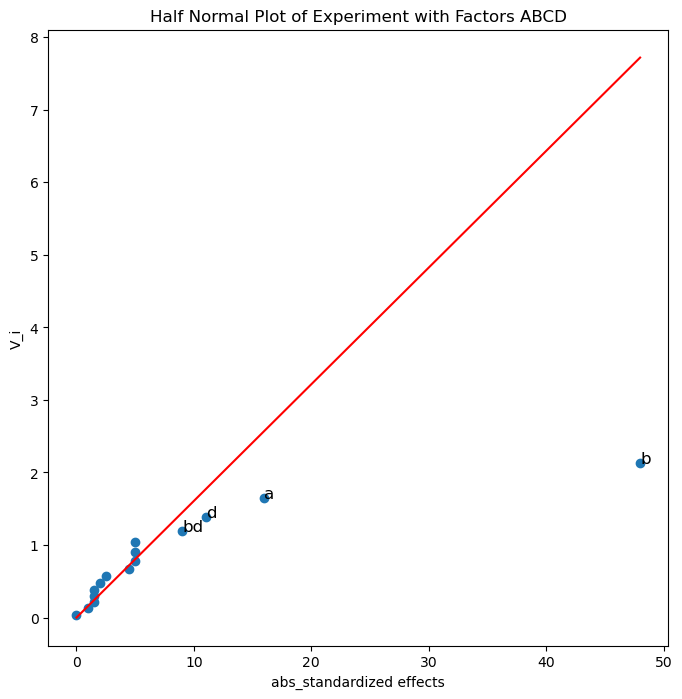

In [21]:
half_norm2.plot_half_norm(title="Half Normal Plot of Experiment with Factors ABCD", data_percent=.75, label_num=4);

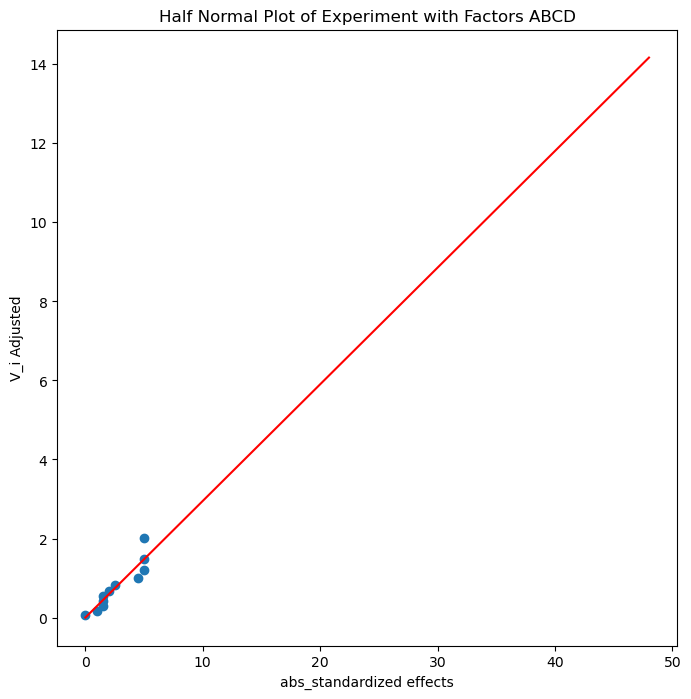

In [14]:
half_norm2.plot_half_norm(title="Half Normal Plot of Experiment with Factors ABCD", num_adjust=4);

It appears that A, B, D, and AB are significant.

#### c.

In [22]:
#get estimate of sigma from regression line
half_norm2.sigma_from_adjusted_regression()

3.388955689458785

An estimate of sigma is 3.389 which is the slope of the regression line running through non-significant effects.

### 4) 
$2^n$ experiments are well suited to experimental research because they enable you to explore different hypothesis with great "economy of experimentation".  For example I am an avid gardener and lets say I wanted to determine the best way to start seedlings for transplant in my vegetable garden.  Using a $2^3$ experiment I would be able to test the effects of the amount of perlite in my soil mix, the amount of compost in my soil mix, and fertilizer concentration on the height of seedlings sometime after I have planted them.  I would be able to do this with 8 experiments!  And probably less once we get into fractional factorial design.  Running 8 experiments and having statistically valid insights into what maximizes the outcomes of my seedlings is not a lot of work for a great deal of very valuable information!  And, since each seedling tray can hold 32 seedlings on it, I could begin to explore how the different kinds of crops I grow (watermelon, cantaloupe, eggplant, and tomatoes for example) interact with the different factors.  I could basically run 4 sets of $2^3$ experiments in parallel for the same amount of work and have a more in-depth understanding of how I should start each crop.

### 5)
In a $2^5$ factorial design there are 5 main effects, one for each factor.  We can use the "n choose r" formula, $\frac{n!}{r!(n-r)!}$ to compute the number of possible combinations

In [23]:
def calc_ncr(n, r):
    return math.factorial(n) / (math.factorial(r)*math.factorial(n-r))

for i in [1,2,3,4,5]:
    if i == 1:
        print(f"For 5 factors there are 5 Main Effects\n")
    else:
        print(f"For {i} factor interactions there are {calc_ncr(5,i)} interaction effects\n")

For 5 factors there are 5 Main Effects

For 2 factor interactions there are 10.0 interaction effects

For 3 factor interactions there are 10.0 interaction effects

For 4 factor interactions there are 5.0 interaction effects

For 5 factor interactions there are 1.0 interaction effects



### 6)

In [24]:
#make label columns of data
data = pd.read_excel('Assignment 2 Question 6 Data.xlsx')
data

,a,b,c,d,response
0,-,-,-,-,71
1,+,-,-,-,61
2,-,+,-,-,90
3,+,+,-,-,82
4,-,-,+,-,68
5,+,-,+,-,61
6,-,+,+,-,87
7,+,+,+,-,80
8,-,-,-,+,61
9,+,-,-,+,50


In [25]:
q6_lm = ols('response ~ a*b*c*d', data=data).fit()
anova = sm.stats.anova_lm(q6_lm)
anova

C:\Users\aburtnerabt\Anaconda3\envs\geo\lib\site-packages\statsmodels\stats\anova.py:138: RuntimeWarning: divide by zero encountered in double_scalars
  (model.ssr / model.df_resid))


,df,sum_sq,mean_sq,F,PR(>F)
a,1.0,2.560000e+02,2.560000e+02,0.0,NaN
b,1.0,2.304000e+03,2.304000e+03,0.0,NaN
c,1.0,2.025000e+01,2.025000e+01,0.0,NaN
d,1.0,1.210000e+02,1.210000e+02,0.0,NaN
a:b,1.0,4.000000e+00,4.000000e+00,0.0,NaN
a:c,1.0,2.250000e+00,2.250000e+00,0.0,NaN
b:c,1.0,6.250000e+00,6.250000e+00,0.0,NaN
a:d,1.0,1.135960e-28,1.135960e-28,0.0,NaN
b:d,1.0,8.100000e+01,8.100000e+01,0.0,NaN
c:d,1.0,2.500000e-01,2.500000e-01,0.0,NaN


In [26]:
anova['mean_sq'] = anova['mean_sq'].apply(lambda x: float(f"{round(x,5)}"))
anova

,df,sum_sq,mean_sq,F,PR(>F)
a,1.0,2.560000e+02,256.00,0.0,NaN
b,1.0,2.304000e+03,2304.00,0.0,NaN
c,1.0,2.025000e+01,20.25,0.0,NaN
d,1.0,1.210000e+02,121.00,0.0,NaN
a:b,1.0,4.000000e+00,4.00,0.0,NaN
a:c,1.0,2.250000e+00,2.25,0.0,NaN
b:c,1.0,6.250000e+00,6.25,0.0,NaN
a:d,1.0,1.135960e-28,0.00,0.0,NaN
b:d,1.0,8.100000e+01,81.00,0.0,NaN
c:d,1.0,2.500000e-01,0.25,0.0,NaN


In [29]:
anova['standardized effect'] = anova['mean_sq']**.5
anova.sort_values(by='standardized effect')

,df,sum_sq,mean_sq,F,PR(>F),standardized effect
a:d,1.0,1.135960e-28,0.00,0.0,NaN,0.0
c:d,1.0,2.500000e-01,0.25,0.0,NaN,0.5
a:c:d,1.0,2.500000e-01,0.25,0.0,NaN,0.5
a:b:c:d,1.0,2.500000e-01,0.25,0.0,NaN,0.5
a:b:d,1.0,1.000000e+00,1.00,0.0,NaN,1.0
a:c,1.0,2.250000e+00,2.25,0.0,NaN,1.5
a:b:c,1.0,2.250000e+00,2.25,0.0,NaN,1.5
b:c:d,1.0,2.250000e+00,2.25,0.0,NaN,1.5
a:b,1.0,4.000000e+00,4.00,0.0,NaN,2.0
b:c,1.0,6.250000e+00,6.25,0.0,NaN,2.5


The ANOVA analysis confirms that A,B,D, and BD are significant